# Foundations of Data Mining: Assignment 4

Please complete all assignments in this notebook. You should submit this notebook, as well as a PDF version (See File > Download as).

In [2]:
%matplotlib inline
from preamble import *
plt.rcParams['savefig.dpi'] = 100 # This controls the size of your figures
# Comment out and restart notebook if you only want the last output of each cell.
# InteractiveShell.ast_node_interactivity = "all"

In [3]:
from IPython.display import clear_output
from IPython.display import Image

## Backpropagation (3 points)

Figure 1 illustrates a simple neural network model.

![Figure 1](images/assignment/small-net.png)

It has single input $x$, two layers with one neuron each. The activation function of both layers is ReLU. 

The parameters $w_0$ and $w_1$ (no biases) are initialized to the following values $w_0 = 1$ and $w_1 = 2$. Implement a single update step of the gradient descent algorithm by hand. Run the update state for the following two data points:

* $(1, 2)$ 
* $(2, 3)$

The goal is to model the relationship between two continuous variables. The learning rate is set to $0.1$

Provide the solution in the following format:

- A choice for a loss function 
- Compute graph for training the neural network
- Partial derivative expression for each of the parameters in the model
- The update expression for each of the parameters for each of the data-points
- The final value of both parameters after the single step in the gradient descent algorithm



### Solution

In [13]:
Image(filename='Assignment4/WechatIMG1936.png')

We use $L=(\hat{y}-y)^2 /2 $ as loss function.


Case $x=1,y=2:$
$$
\begin{align}
Q&=w_0 * x =1,\\
q&=max\{0,Q\}=1\\
O&=w_1*Q =2,\\
o&=max\{0,O\}=2\\
L&=(2-2)^2 /2 =0.
\end{align}
$$


$\frac{\partial L}{\partial L}=1 $, the partial derivatives of L with respect to other parameters is 0. Hence there is no update for $w_0, w_1.$

Case $x=2,y=3$:
$$
\begin{align}
Q&=w_0 * x =2,\\
q&=max\{0,Q\}=2\\
O&=w_1*Q =4,\\
o&=max\{0,O\}=4\\
L&=(2-2)^2 /2 =0.5.
\end{align}
$$



Hence we have 
$$
\begin{align}
\frac{\partial L}{\partial L} & =1\\
\frac{\partial L}{\partial O} & = \frac{\partial L}{\partial o}\frac{\partial o}{\partial O}=(0-y)=1\\
\frac{\partial L}{\partial Q} & = \frac{\partial L}{\partial o}\frac{\partial o}{\partial O}
                                   \frac{\partial O}{\partial q} \frac{\partial q}{\partial Q} 
                                =2\\
\frac{\partial L}{\partial w_1} & = \frac{\partial L}{\partial o}\frac{\partial o}{\partial O}
                                   \frac{\partial O}{\partial w_1} 
                                   =2\\
\frac{\partial L}{\partial w_0} & = \frac{\partial L}{\partial o}\frac{\partial o}{\partial O}
                                   \frac{\partial O}{\partial q}\frac{\partial q}{\partial Q} \frac{\partial Q}{\partial w_0} =4\\
\frac{\partial L}{\partial x} & = \frac{\partial L}{\partial o}\frac{\partial o}{\partial O} \frac{\partial O}{\partial q} \frac{\partial q}{\partial Q} \frac{\partial Q}{\partial x}=2\\
\end{align}
$$

$$w_0 \leftarrow w_0 -\alpha  \frac{\partial L}{\partial w_0}=1-0.1\times 4=0.6.$$

$$w_1 \leftarrow w_1 -\alpha  \frac{\partial L}{\partial w_1}=2-0.1\times 2=1.8.$$

Hence the weights has been updated.



## Training Deep Models (3 points)

The model in the example code below performs poorly as its depth increases. Train this model on the MNIST digit detection task. 

Examine its training performance by gradually increasing its depth:
- Set the depth to 1 hidden layer
- Set the depth to 2 hidden layers
- Set the depth to 3 hidden layers

Modify the model such that you improve its performance when its depth increases. Train the new model again for the different depths:
- Set the depth to 1 hidden layer
- Set the depth to 2 hidden layers
- Set the depth to 3 hidden layers

Submit an explanation for the limitation of the original model. Explain your modification. 
Submit your code and 6 plots (can be overlaid) for the training performance of both models with different depths. 



In [2]:
# (You don't need to change this part of the code)
from __future__ import print_function
import numpy as np
np.random.seed(1234)

from keras.datasets import mnist
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.optimizers import SGD
from keras.utils import np_utils


import matplotlib.pyplot as plt

batch_size = 128
nb_classes = 10
nb_epoch = 10

Using TensorFlow backend.


In [3]:
# (You don't need to change this part of the code)
# the data, shuffled and split between train and test sets
(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)

X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
Y_train = np_utils.to_categorical(y_train, nb_classes)
Y_test = np_utils.to_categorical(y_test, nb_classes)

60000 train samples
10000 test samples


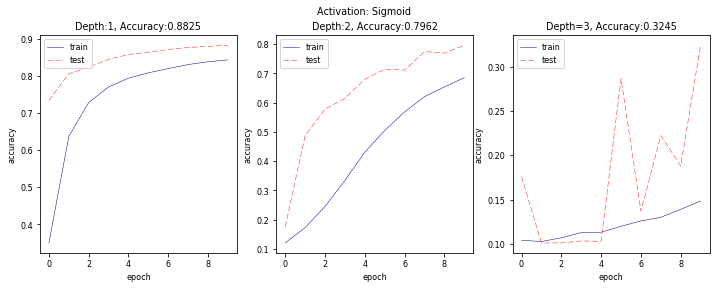

In [22]:
# Activation function = Sigmod
Debug = False

if Debug:
    nb_epoch = 1
else:
    nb_epoch = 10

plt.figure(figsize=(12, 4))
plt.suptitle('Activation: Sigmoid')
    
# Use this parameter to change the depth of the model
number_hidden_layers = 1  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='sigmoid'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('sigmoid'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 1)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth:1, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# Use this parameter to change the depth of the model
number_hidden_layers = 2  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='sigmoid'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('sigmoid'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 2)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth:2, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# Use this parameter to change the depth of the model
number_hidden_layers = 3  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='sigmoid'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('sigmoid'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 3)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth=3, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')


clear_output()
plt.show()

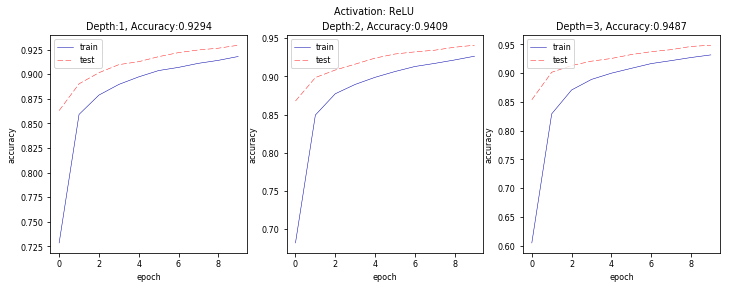

In [23]:
# Activation function = ReLU
Debug = False

if Debug:
    nb_epoch = 1
else:
    nb_epoch = 10

plt.figure(figsize=(12, 4))
plt.suptitle('Activation: ReLU')
    
# Use this parameter to change the depth of the model
number_hidden_layers = 1  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='relu'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 1)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth:1, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# Use this parameter to change the depth of the model
number_hidden_layers = 2  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='relu'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 2)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth:2, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# Use this parameter to change the depth of the model
number_hidden_layers = 3  # Number of hidden layers

# Model
model = Sequential()
model.add(Dense(512, input_shape=(784,), activation='relu'))
model.add(Dropout(0.2))

while number_hidden_layers > 1:
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.2))
    number_hidden_layers -= 1


model.add(Dense(10))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer=SGD(),
              metrics=['accuracy'])


# Training (You don't need to change this part of the code)
history = model.fit(X_train, Y_train,
                    batch_size=batch_size, nb_epoch=nb_epoch,
                    verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.subplot(1, 3, 3)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Depth=3, Accuracy:{}'.format(score[1]))
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')


clear_output()
plt.show()

### Explaination
- The original model, i.e. the ones with sigmoid activation, perform disastrously as layers go deeper. According to lecture notes, I think it is because there exist gradient explosion and gradient vanishing problems in deep MLP classifiers with sigmoid activation.
- To adress this problem, we changed activation to ReLU, which is able to solve gradient explosion and gradient vanishing problems effecitvely. As is shown in the graphs, ReLU activation works well with deep MLP classifiers. The performance of classifiers with such activation promote when layers go deeper.

## Convolutional Neural Networks for Filtering (2 points)

Convolutional neural networks are well suited for analyzing images. They can be used to apply various image filtering operations. 

The goal of this exercise is to design a CNN model that applies 2 filters to its input images. The input images are 128x128 RGB color images, encoded as 128x128x3 tensor with floating point value normalized between 0 and 1. The RGB format is such that the pixels address by: [:, :, 0] encode the red pixels of the image, the pixels addressed by [:, :, 1] define the green pixels and pixels addressed by [:, :, 2] define the blue pixels. 

Design a convolutional neural network that will: 
1. Apply the sepia filter to the image
2. Apply Gaussian smoothing to the image

Use the specification of the sepia and the Gaussian filter below. 

You answer should contain:
    - The definition of the architecture of the CNN
        - Number of layers
        - Number of filters per layer
        - Shape of the filter per layer
    - Values of each of the parameters of the CNN when using a 5x5 Gaussian smoothing filter
    - The dimensions of the output image when a 5x5 Gaussian smothing is applied


The sepia effect gives warmth and a feel of vintage to photographs. The sepia filter is defined as:

\begin{equation}
R_o = (R_i * .393) + (G_i *.769) + (B_i * .189)\\
G_o = (R_i * .349) + (G_i *.686) + (B_i * .168)\\
B_o = (R_i * .272) + (G_i *.534) + (B_i * .131)
\end{equation}

Gaussian blurring is an effect that reduces the noise and details in an image. 
Gaussian smoothing filter:
$$G(x, y)=\frac{1}{2\pi\sigma^2}e^{-\frac{x^2+y^2}{2\sigma^2}}$$

- A discretized version of the filter is given by the following table:

<table>
<tr><td>1</td><td>4</td><td>7</td><td>4</td><td>1</td></tr>
<tr><td>4</td><td>16</td><td>26</td><td>16</td><td>4</td></tr>
<tr><td>7</td><td>26</td><td>41</td><td>26</td><td>7</td></tr>
<tr><td>4</td><td>16</td><td>26</td><td>16</td><td>4</td></tr>
<tr><td>1</td><td>4</td><td>7</td><td>4</td><td>1</td></tr>
</table>


- To normalize the filter response, each value should divided by $273$. This is a truncated discretized Gaussian filter with a $\sigma$ of 1.


### Solution

In [352]:
Image(filename='Assignment4/WechatIMG1935.png')

We have 3 layers generally:
Input layer; Convolution layer; Output layer.


In each layer, we have 3 channels: R, G, B. In input and output layers, there is no filters to be applied.

In convolution layer: we divide this layer into two sub-layers: Sepia-filter layer and Guassian-smoothing layer. We first apply Sepia and then Guassian blurring.
The order of which filter applied is not important since  Sepia and Guassian are linear kernel and convolution is associative when kernels are linear. Hence we keep the order like this.
If we convolute Sepia and $5 \times 5$ Guassian as one filter in each channel, then we see, the size of this filter is $5 \times 5 \times 3$ since that a scaler convolutes a matrix preserve size. In our solution, we consider we only have one filter which is convoluted by Sepia and Guassian. Hence, in convolution layer, the number of filters is 3 appied to corresponding channel and the shape of each filter is$5 \times 5 \times 3$.

In terms of the shape of output, we consider there is no padding to raw image and stride is 1. Thus we have a $(128-5+1)\times (128-5+1) \times 3= 124 \times 124 \times 3$ dimensional image.

We assume, in one certain channel, the input matrix is $H_{128 \times 128}$ and define Guassian filter in this channel is $G_{5 \times 5}$, then the ouput matrix O should be: $\forall i,j =1,2,\dots, 128-5+1 $
$$ O(i,j)=\sum_{k=1}^{5}\sum_{l=1}^{5} H(i-k+1,j-l+1) \times G(k,l).$$ So we could apply this convolution method to each channel, using same Guassian table $G_{5 \times 5}$ and get an updated $124 \times 124 \times 3$ image.

## Model Design (2 Points)

Various decisions need to be made in a modeling process to address specific properties of the data and the modeling goal. In this task, you are given a description of a data structure and a goal for which you need to design a model. 

Produce a figure depicting your model. Briefly explain the figure and justify all decisions made in the modeling process. In detail, describe at least: 
- Input data format
- Number of layers
- Type of layers (Dense, Recurrent, Convolutional - 1D, 2D, 3D)
- Regularization
- Model output
- Loss function

The training and execution procedures for the model may differ, so you can use different descriptions for both. 

*Data and goal description:*

The goal of this task is to generate captions for short video clips. 

The video data is structured as sequences of color images. The model needs to be able to process a number of consecutive images that form a short video clip. The training data consists of video clips (few seconds) and a short caption (5-10 words). 

For simplicity, the accuracy of the model is evaluated on the exact prediction of the caption. In other words, the model needs to produce correctly the specific words in a specific order for each video. 

### Solution

In [353]:
Image(filename='Assignment4/WechatIMG1937.png')

Based on the earlier works of S. Venugopalan et al.,(2015) and S. Venugopalan et al.,(2015) (we put the links in the end of this cell), we have the following model.

**Model Description**:

We construct a sequence to sequence model for short video clip captioning, where the input is the sequence of images $(x_1,x_2,\dots, x_n)$ and the output is a sequence of words $(y_1,y_2,\dots, y_m)$. The target output are represented using 1-of-N coding, where N is the size of the vocabulary.

 - Layers
 
 From the above graph, you can see that we have 4 layers:
   - Input Layer
   - Convolution Layer
   - Recurrent Layer
   - Output Layer
   
   
   
 - **Training**
  
In the convolution layer, we use Convolutional Neural Network before Mean Pooling to get a fixed dimensional vector representation. Input this at every time step to the Recurrent Net.

Then we apply two-stacked LSTM. 
  - The first LSTM is used to model the visual features sequence and output the hidden representation of the image sequence ($h_t$).
  - The second LSTM layer is used to model the output word sequence  given the text input and the hidden representation.
    
The second SLTM is fed the beginning-of-sentence($<BOS>$) tag starting to generate a sentence, after all the images in the short video are exhausted. In the second SLTM layer, a distribution is defined over the output sequence Y$(y_1,y_2,\dots, y_m)$  given the input sequence X$(x_1,x_2,\dots, x_n)$ and a softmax function is applied to get the probability distribution over the words $y'$ in the vocabulary V.

Our model focus on the loss function derived using the log-liklihood of the predicted output sentence given the hidden representation of the visual image sequence, and the previous words it has seen. In this model with parameters $\theta$ and the output sequence $Y=(y_1,y_2,\dots, y_m)$, this loss function is formulated as:

$$\theta^*=argmax_{\theta} \sum_{t=1}^{m}\log p(y_t|h_{n+t-1,y_{t-1};\theta}).$$

In the output layer, the word $y_t$ is chosed with the maximum proability until it emits the end-of-sentence ($<EOS>$) tag.

Enough training data should be provided in order to get sound CNN and LSMT networks. To avoid overfitting the trainning data, one possible way is to input noises to the input data. Another way is to apply dropout to LSTM.


Reference:

1.Subhashini Venugopalan, Marcus Rohrbach, Jeff Donahue, Raymond Mooney, Trevor Darrell, and Kate Saenko, Sequence to Sequence--Video to Text, arXiv:1505.00487
https://arxiv.org/pdf/1505.00487.pdf

2.Subhashini Venugopalan, Huijuan Xu, Jeff Donahue, Marcus Rohrbach, Raymond Mooney, and Kate Saenko, Translating Videos to Natural Language Using Deep Recurrent Neural Networks, arXiv:1412.4729
https://arxiv.org/pdf/1412.4729.pdf

## MNIST Calculator (5 points)

During the lectures you have seen a CNN model that can be successfully trained to classify the MNIST images. You have also seen how a RNN model that can be trained to implement addition of two numbers. 

Using the KERAS (or TensorFlow) library, design and train a model that can learn how to add numbers directly from the MNIST image data. More specifically, the model should input a sequence of a set of images and produces a cumulative sum of the numbers represented by the digits in the images.

For example:

Input 1: ![294](images/294.png)

Input 2: ![61](images/61.png)

Output: 355




In [354]:
Debug = False

### Scheme
- Since we do not really understand what 'direct' means, I tried two methods. The first one simply combines a CNN that recognize digits and a RNN computing sum. The second one seems more 'direct' because CNN and RNN are integerated into one model, which is trained to compute sum directly from input images. Here we first present the simple one before we present the 'direct' one.

### CNN Training For Digits Recognition

In [10]:
# Imports
from __future__ import print_function
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

# Training parameters
batch_size = 128
num_classes = 10
epochs = 1 if Debug else 12

# Data preparation

# input image dimensions
img_rows, img_cols = 28, 28

# the data, shuffled and split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)


# Model definition
model_cnn = Sequential()
model_cnn.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))
model_cnn.add(Flatten())
model_cnn.add(Dense(128, activation='relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(Dense(num_classes, activation='softmax'))

model_cnn.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

# Training loop

model_cnn.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))
score = model_cnn.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples
Train on 60000 samples, validate on 10000 samples
Epoch 1/12
60000/60000 [==============================] - 117s - loss: 0.3360 - acc: 0.8994 - val_loss: 0.0826 - val_acc: 0.9733

### Training RNN For Addition (3 Digits)

In [11]:
# Imports
from __future__ import print_function
from keras.models import Sequential
from keras.engine.training import _slice_arrays
from keras.layers import Activation, TimeDistributed, Dense, RepeatVector, recurrent
import numpy as np
from six.moves import range

class CharacterTable(object):
    '''
    Given a set of characters:
    + Encode them to a one hot integer representation
    + Decode the one hot integer representation to their character output
    + Decode a vector of probabilities to their character output
    '''
    def __init__(self, chars, maxlen):
        self.chars = sorted(set(chars))
        self.char_indices = dict((c, i) for i, c in enumerate(self.chars))
        self.indices_char = dict((i, c) for i, c in enumerate(self.chars))
        self.maxlen = maxlen

    def encode(self, C, maxlen=None):
        maxlen = maxlen if maxlen else self.maxlen
        X = np.zeros((maxlen, len(self.chars)))
        for i, c in enumerate(C):
            X[i, self.char_indices[c]] = 1
        return X

    def decode(self, X, calc_argmax=True):
        if calc_argmax:
            X = X.argmax(axis=-1)
        return ''.join(self.indices_char[x] for x in X)


class colors:
    ok = '\033[92m'
    fail = '\033[91m'
    close = '\033[0m'
    
# Parameters for the model and dataset
TRAINING_SIZE = 10000
DIGITS = 3
INVERT = True
# Try replacing GRU, or SimpleRNN
#RNN = recurrent.LSTM
RNN = recurrent.SimpleRNN
HIDDEN_SIZE = 128
BATCH_SIZE = 128
LAYERS = 1
MAXLEN = DIGITS + 1 + DIGITS

chars = '0123456789+ '
ctable = CharacterTable(chars, MAXLEN)

questions = []
expected = []
seen = set()
print('Generating data...')
while len(questions) < TRAINING_SIZE:
    f = lambda: int(''.join(np.random.choice(list('0123456789')) for i in range(np.random.randint(1, DIGITS + 1))))
    a, b = f(), f()
    # Skip any addition questions we've already seen
    # Also skip any such that X+Y == Y+X (hence the sorting)
    key = tuple(sorted((a, b)))
    if key in seen:
        continue
    seen.add(key)
    # Pad the data with spaces such that it is always MAXLEN
    q = '{}+{}'.format(a, b)
    query = q + ' ' * (MAXLEN - len(q))
    ans = str(a + b)
    # Answers can be of maximum size DIGITS + 1
    ans += ' ' * (DIGITS + 1 - len(ans))
    if INVERT:
        query = query[::-1]
    questions.append(query)
    expected.append(ans)
print('Total addition questions:', len(questions))

print('Vectorization...')
X = np.zeros((len(questions), MAXLEN, len(chars)), dtype=np.bool)
y = np.zeros((len(questions), DIGITS + 1, len(chars)), dtype=np.bool)
for i, sentence in enumerate(questions):
    X[i] = ctable.encode(sentence, maxlen=MAXLEN)
for i, sentence in enumerate(expected):
    y[i] = ctable.encode(sentence, maxlen=DIGITS + 1)

# Shuffle (X, y) in unison as the later parts of X will almost all be larger digits
indices = np.arange(len(y))
np.random.shuffle(indices)
X = X[indices]
y = y[indices]

# Explicitly set apart 10% for validation data that we never train over
split_at = int(len(X) - len(X) / 10)
(X_train, X_val) = (_slice_arrays(X, 0, split_at), _slice_arrays(X, split_at))
(y_train, y_val) = (y[:split_at], y[split_at:])

print(X_train.shape)
print(y_train.shape)


print('Build model...')
model_rnn = Sequential()
# "Encode" the input sequence using an RNN, producing an output of HIDDEN_SIZE
# note: in a situation where your input sequences have a variable length,
# use input_shape=(None, nb_feature).
model_rnn.add(RNN(HIDDEN_SIZE, input_shape=(MAXLEN, len(chars))))
# For the decoder's input, we repeat the encoded input for each time step
model_rnn.add(RepeatVector(DIGITS + 1))
# The decoder RNN could be multiple layers stacked or a single layer
for _ in range(LAYERS):
    model_rnn.add(RNN(HIDDEN_SIZE, return_sequences=True))

# For each of step of the output sequence, decide which character should be chosen
model_rnn.add(TimeDistributed(Dense(len(chars))))
model_rnn.add(Activation('softmax'))

model_rnn.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Train the model each generation and show predictions against the validation dataset
for iteration in range(1, 2 if Debug else 200):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model_rnn.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=1,
              validation_data=(X_val, y_val))
    ###
    # Select 10 samples from the validation set at random so we can visualize errors
    for i in range(10):
        ind = np.random.randint(0, len(X_val))
        rowX, rowy = X_val[np.array([ind])], y_val[np.array([ind])]
        preds = model_rnn.predict_classes(rowX, verbose=0)
        q = ctable.decode(rowX[0])
        correct = ctable.decode(rowy[0])
        guess = ctable.decode(preds[0], calc_argmax=False)
        print('Q', q[::-1] if INVERT else q)
        print('T', correct)
        print(colors.ok + '☑' + colors.close if correct == guess else colors.fail + '☒' + colors.close, guess)
        print('---')

Generating data...
Total addition questions: 10000
Vectorization...
(9000, 7, 12)
(9000, 4, 12)
Build model...

--------------------------------------------------
Iteration 1
Train on 9000 samples, validate on 1000 samples
Epoch 1/1
9000/9000 [==============================] - 2s - loss: 1.7892 - acc: 0.3719 - val_loss: 1.6276 - val_acc: 0.4150

### Integration and Tests



Test 1
6/6 [==============================] - 0s
Input 1:


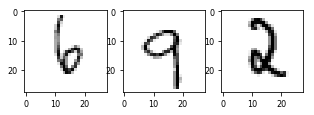

Input 2:


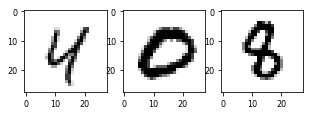

Output:
692+408=1191  ☒


Test 2
6/6 [==============================] - 0s
Input 1:


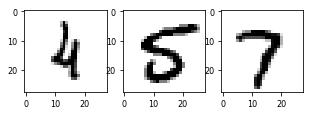

Input 2:


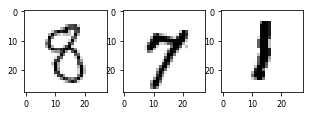

Output:
457+871=1339  ☒


Test 3
6/6 [==============================] - 0s
Input 1:


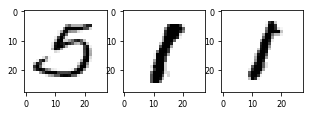

Input 2:


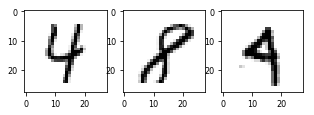

Output:
511+484=1195  ☒


Test 4
6/6 [==============================] - 0s
Input 1:


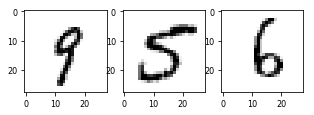

Input 2:


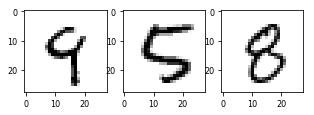

Output:
956+958=1805  ☒


Test 5
6/6 [==============================] - 0s
Input 1:


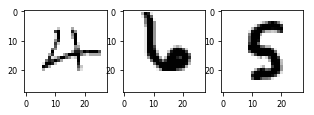

Input 2:


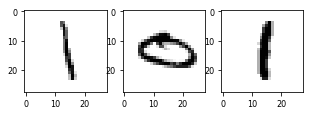

Output:
465+101=555   ☒


Test 6
6/6 [==============================] - 0s
Input 1:


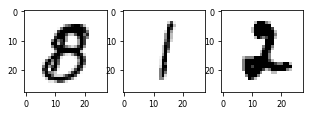

Input 2:


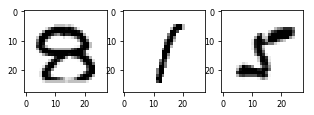

Output:
812+815=1667  ☒


Test 7
6/6 [==============================] - 0s
Input 1:


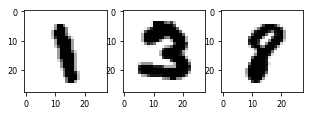

Input 2:


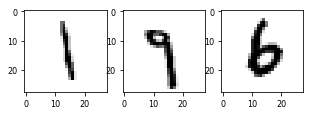

Output:
138+196=245   ☒


Test 8
6/6 [==============================] - 0s
Input 1:


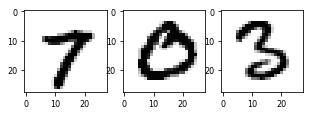

Input 2:


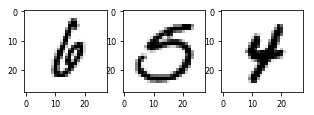

Output:
703+654=1467  ☒


Test 9
6/6 [==============================] - 0s
Input 1:


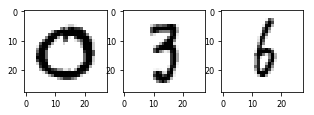

Input 2:


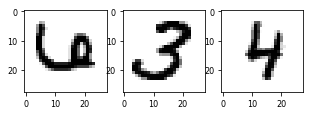

Output:
036+634=9042  ☒


In [15]:
for j in range(1,10):
    print("\n\nTest {}".format(j))
    
    index = np.random.randint(0,len(x_train),6)
    
    digit_graph = x_train[index]
    digit_predicts = model_cnn.predict_classes(digit_graph)
    a = str(digit_predicts[2])+str(digit_predicts[1])+str(digit_predicts[0])
    b = str(digit_predicts[5])+str(digit_predicts[4])+str(digit_predicts[3])
    q = '{}+{}'.format(a, b)
    query = q + ' ' * (MAXLEN - len(q))
    ans = str(a + b)
    ans += ' ' * (DIGITS + 1 - len(ans))
    if INVERT:
        query = query[::-1]
    question = []
    question.append(query)
    X = np.zeros((len(question), MAXLEN, len(chars)), dtype=np.bool)
    for i, sentence in enumerate(question):
        X[i] = ctable.encode(sentence, maxlen=MAXLEN)
    sum_preds = model_rnn.predict_classes(X[np.array([0])], verbose=0)
    sum_guess = ctable.decode(sum_preds[0], calc_argmax=False)

    print("Input 1:")
    _=plt.subplot(1, 3, 1);
    _=plt.imshow(digit_graph[2].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.subplot(1, 3, 2);
    _=plt.imshow(digit_graph[1].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.subplot(1, 3, 3);
    _=plt.imshow(digit_graph[0].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.show()
    print("Input 2:")
    _=plt.subplot(1, 3, 1);
    _=plt.imshow(digit_graph[5].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.subplot(1, 3, 2);
    _=plt.imshow(digit_graph[4].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.subplot(1, 3, 3);
    _=plt.imshow(digit_graph[3].reshape(28, 28), cmap=plt.cm.gray_r)
    _=plt.show()
    print("Output:")
    print("{}={} ".format(q, sum_guess), '☑' if a+b==int(sum_guess) else '☒')

### A More Direct Version

Generating data...

--------------------------------------------------
Iteration 1
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 758s - loss: 1.4937 - acc: 0.4610 - val_loss: 1.3632 - val_acc: 0.5013

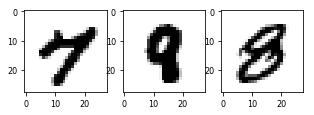

Input 2:



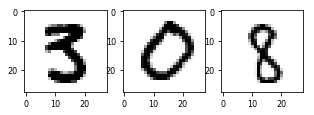

Output:
788+308=1277  ☒


Test:1
1/1 [==============================] - 0s
Input 1:



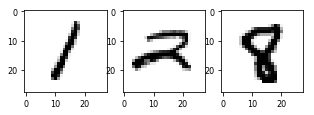

Input 2:



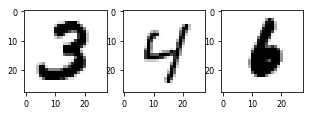

Output:
128+346=1277  ☒


Test:2
1/1 [==============================] - 0s
Input 1:



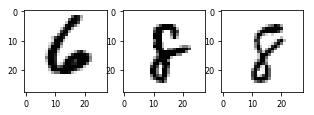

Input 2:



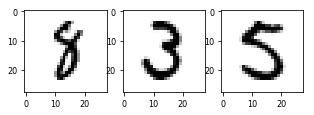

Output:
688+835=1277  ☒

--------------------------------------------------
Iteration 2
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 741s - loss: 1.0741 - acc: 0.6012 - val_loss: 0.9607 - val_acc: 0.6270

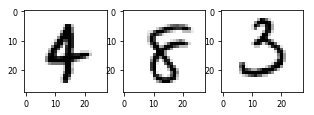

Input 2:



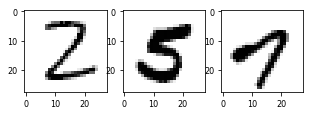

Output:
483+257=111   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



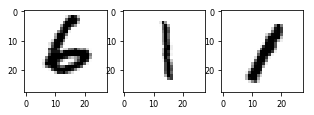

Input 2:



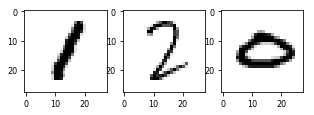

Output:
611+120=111   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



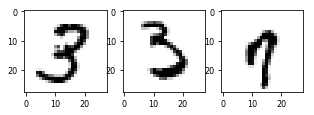

Input 2:



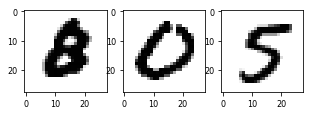

Output:
337+805=111   ☒

--------------------------------------------------
Iteration 3
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 739s - loss: 0.9470 - acc: 0.6297 - val_loss: 0.8520 - val_acc: 0.6473

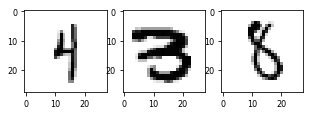

Input 2:



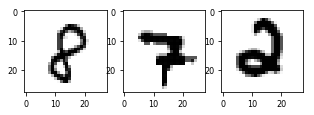

Output:
438+872=1111  ☒


Test:1
1/1 [==============================] - 0s
Input 1:



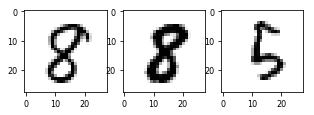

Input 2:



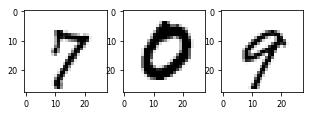

Output:
885+709=1111  ☒


Test:2
1/1 [==============================] - 0s
Input 1:



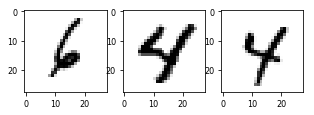

Input 2:



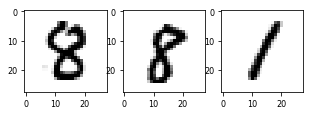

Output:
644+881=1111  ☒

--------------------------------------------------
Iteration 4
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 738s - loss: 0.8736 - acc: 0.6443 - val_loss: 0.7776 - val_acc: 0.6623

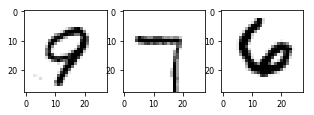

Input 2:



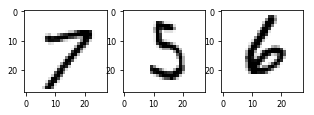

Output:
976+756=1765  ☒


Test:1
1/1 [==============================] - 0s
Input 1:



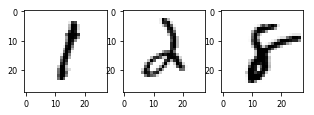

Input 2:



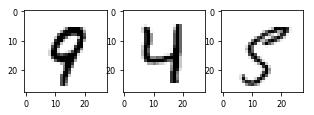

Output:
128+945=1765  ☒


Test:2
1/1 [==============================] - 0s
Input 1:



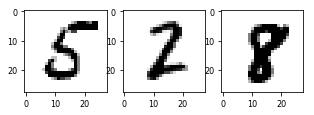

Input 2:



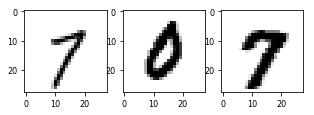

Output:
528+707=1765  ☒

--------------------------------------------------
Iteration 5
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 739s - loss: 0.8325 - acc: 0.6525 - val_loss: 0.7410 - val_acc: 0.6679

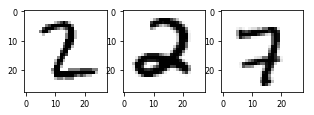

Input 2:



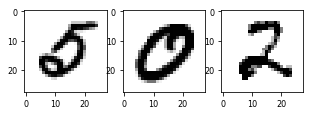

Output:
227+502=729   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



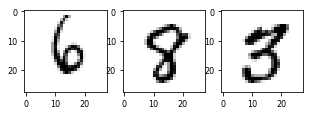

Input 2:



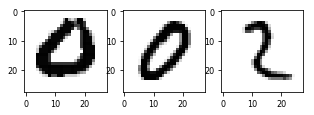

Output:
683+002=729   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



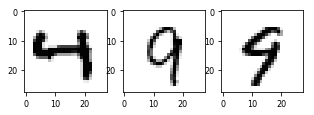

Input 2:



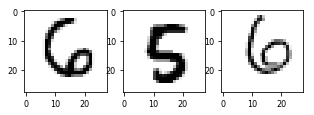

Output:
499+656=729   ☒

--------------------------------------------------
Iteration 6
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 742s - loss: 0.8069 - acc: 0.6572 - val_loss: 0.7084 - val_acc: 0.6746

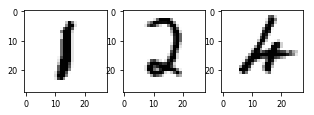

Input 2:



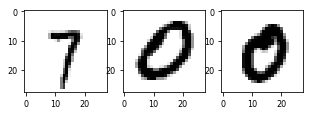

Output:
124+700=844   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



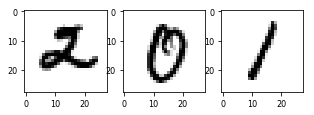

Input 2:



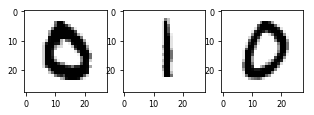

Output:
201+010=844   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



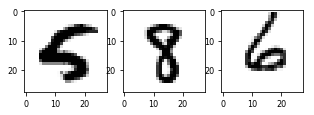

Input 2:



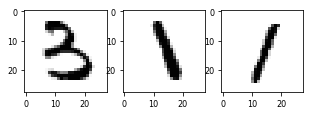

Output:
586+311=844   ☒

--------------------------------------------------
Iteration 7
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 741s - loss: 0.7845 - acc: 0.6626 - val_loss: 0.6916 - val_acc: 0.6785

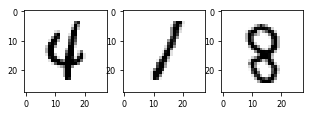

Input 2:



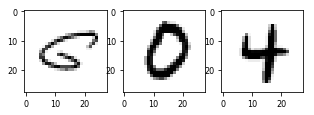

Output:
418+604=132   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



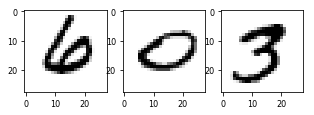

Input 2:



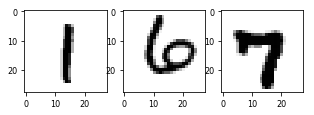

Output:
603+167=132   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



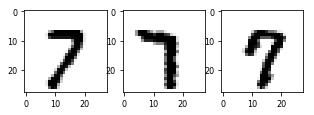

Input 2:



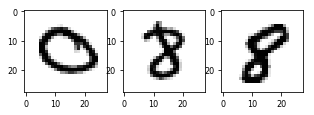

Output:
777+088=132   ☒

--------------------------------------------------
Iteration 8
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 742s - loss: 0.7709 - acc: 0.6656 - val_loss: 0.6708 - val_acc: 0.6848

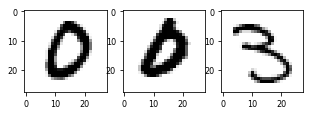

Input 2:



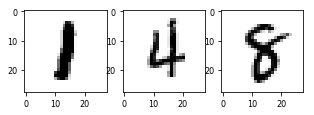

Output:
003+148=948   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



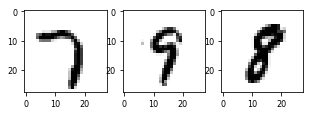

Input 2:



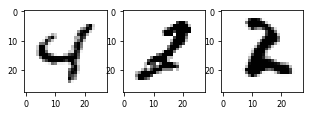

Output:
798+422=948   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



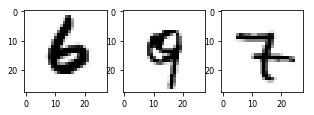

Input 2:



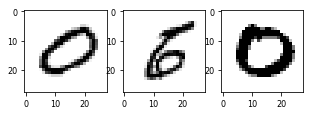

Output:
697+060=948   ☒

--------------------------------------------------
Iteration 9
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 742s - loss: 0.7607 - acc: 0.6678 - val_loss: 0.6587 - val_acc: 0.6875

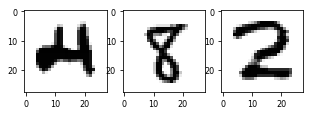

Input 2:



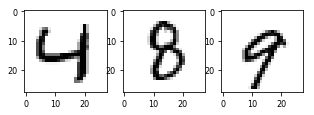

Output:
482+489=147   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



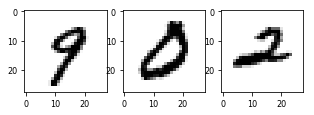

Input 2:



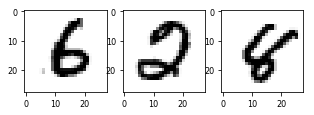

Output:
902+628=147   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



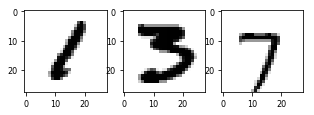

Input 2:



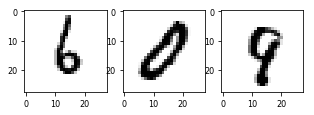

Output:
137+609=147   ☒

--------------------------------------------------
Iteration 10
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 743s - loss: 0.7487 - acc: 0.6711 - val_loss: 0.6514 - val_acc: 0.6878

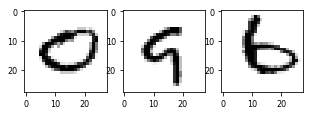

Input 2:



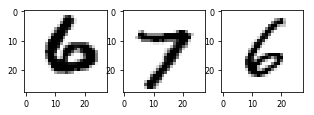

Output:
096+676=1376  ☒


Test:1
1/1 [==============================] - 0s
Input 1:



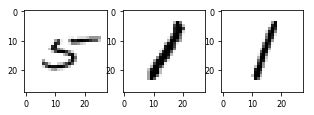

Input 2:



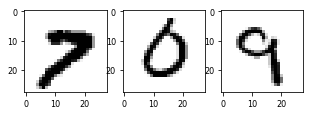

Output:
511+709=1376  ☒


Test:2
1/1 [==============================] - 0s
Input 1:



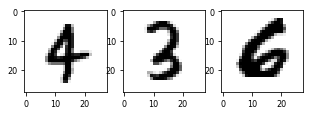

Input 2:



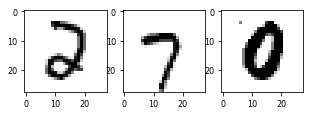

Output:
436+270=1376  ☒

--------------------------------------------------
Iteration 11
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 743s - loss: 0.7429 - acc: 0.6725 - val_loss: 0.6450 - val_acc: 0.6873

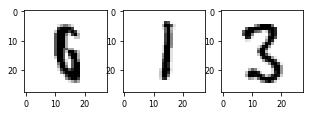

Input 2:



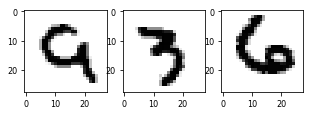

Output:
613+936=1297  ☒


Test:1
1/1 [==============================] - 0s
Input 1:



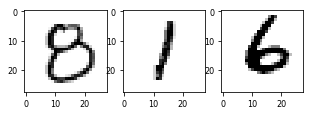

Input 2:



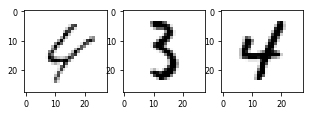

Output:
816+434=1297  ☒


Test:2
1/1 [==============================] - 0s
Input 1:



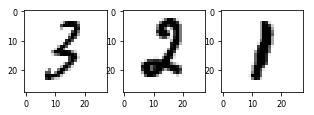

Input 2:



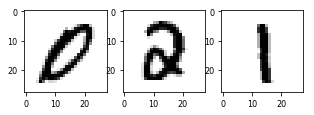

Output:
321+021=1297  ☒

--------------------------------------------------
Iteration 12
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 743s - loss: 0.7376 - acc: 0.6743 - val_loss: 0.6334 - val_acc: 0.6925

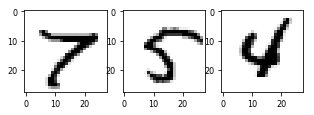

Input 2:



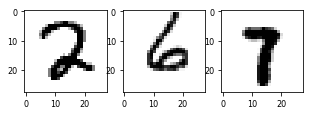

Output:
754+267=101   ☒


Test:1
1/1 [==============================] - 0s
Input 1:



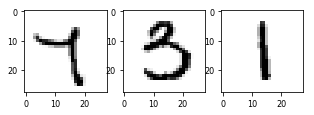

Input 2:



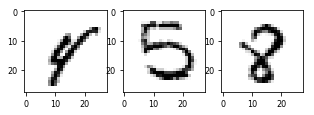

Output:
731+458=101   ☒


Test:2
1/1 [==============================] - 0s
Input 1:



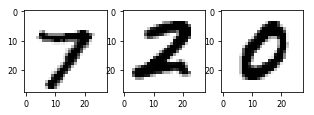

Input 2:



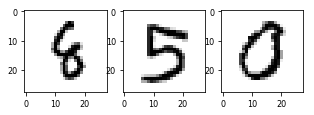

Output:
720+850=101   ☒

--------------------------------------------------
Iteration 13
Generating data...
Train on 540000 samples, validate on 60000 samples
Epoch 1/3
540000/540000 [==============================] - 745s - loss: 0.7289 - acc: 0.6755 - val_loss: 0.6262 - val_acc: 0.6945

KeyboardInterrupt: 

In [8]:
Debug = False

from __future__ import print_function
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.engine.training import _slice_arrays
from keras.layers import Activation, TimeDistributed, Dense, RepeatVector, recurrent
import numpy as np
from six.moves import range
from keras.datasets import mnist
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

class CharacterTable(object):
    def __init__(self, chars, maxlen):
        self.chars = sorted(set(chars))
        self.char_indices = dict((c, i) for i, c in enumerate(self.chars))
        self.indices_char = dict((i, c) for i, c in enumerate(self.chars))
        self.maxlen = maxlen

    def encode(self, C, maxlen=None):
        maxlen = maxlen if maxlen else self.maxlen
        X = np.zeros((maxlen, len(self.chars)))
        for i, c in enumerate(C):
            X[i, self.char_indices[c]] = 1
        return X

    def decode(self, X, calc_argmax=True):
        if calc_argmax:
            X = X.argmax(axis=-1)
        return ''.join(self.indices_char[x] for x in X)

# Parameters for the model and dataset
TRAINING_SIZE = 1000 if Debug else 600000
DIGITS = 3
INVERT = True
RNN = recurrent.LSTM
HIDDEN_SIZE = 256
BATCH_SIZE = 512
LAYERS = 2
MAXLEN = DIGITS + DIGITS

chars = '0123456789 '
ctable = CharacterTable(chars, MAXLEN)

img_rows = img_cols = 28

(x_train, Y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

    print('Generating data...')
    X = np.zeros([TRAINING_SIZE, MAXLEN] + list(input_shape), dtype=x_train.dtype)
    y = np.zeros((TRAINING_SIZE, DIGITS + 1, len(chars)), dtype=np.bool)

for i in range(0, TRAINING_SIZE):
    f = lambda: int(''.join(np.random.choice(list('0123456789')) for i in range(np.random.randint(1, DIGITS + 1))))
    a, b = f(), f()
    q = '{}{}'.format(a, b)
    query = q + ' ' * (MAXLEN - len(q))
    ans = str(int(a) + int(b))
    # Answers can be of maximum size DIGITS + 1
    ans += ' ' * (DIGITS + 1 - len(ans))
    if INVERT:
        query = query[::-1]

    for j, char in enumerate(query):
        if char in '0123456789':
            image = None
            while image is None:
                k = np.random.choice(Y_train.shape[0])
                if Y_train[k] == int(char):
                    image = x_train[k]
        else:
            image = 255 * np.zeros(input_shape)
        X[i, j] = image    
    y[i] = ctable.encode(ans, maxlen=DIGITS + 1)

indices = np.arange(len(y))
np.random.shuffle(indices)
X, y =  X[indices], y[indices]

split_at = int(len(X) - len(X) / 10)
(X_train, X_val) = (_slice_arrays(X, 0, split_at), _slice_arrays(X, split_at))
(y_train, y_val) = (y[:split_at], y[split_at:])
    
model = Sequential()

model.add(TimeDistributed(Conv2D(32, (5, 5), activation='relu', strides=3),
                          input_shape=X_train.shape[1:]))
model.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))
model.add(Dropout(0.25))

model.add(TimeDistributed(Conv2D(64, (3, 3), activation='relu', strides=1)))
model.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))
model.add(Dropout(0.5))

model.add(TimeDistributed(Flatten()))
model.add(TimeDistributed(Dense(256, activation='relu')))

model.add(RNN(HIDDEN_SIZE))
model.add(RepeatVector(DIGITS + 1))
for _ in range(LAYERS):
    model.add(RNN(HIDDEN_SIZE, return_sequences=True))

# For each of step of the output sequence, decide which character should be chosen
model.add(TimeDistributed(Dense(len(chars))))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

for iteration in range(1, 4 if Debug else 200):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    
    print('Generating data...')
    X = np.zeros([TRAINING_SIZE, MAXLEN] + list(input_shape), dtype=x_train.dtype)
    y = np.zeros((TRAINING_SIZE, DIGITS + 1, len(chars)), dtype=np.bool)

    for i in range(0, TRAINING_SIZE):
        f = lambda: int(''.join(np.random.choice(list('0123456789')) for i in range(np.random.randint(1, DIGITS + 1))))
        a, b = f(), f()
        q = '{}{}'.format(a, b)
        query = q + ' ' * (MAXLEN - len(q))
        ans = str(int(a) + int(b))
        # Answers can be of maximum size DIGITS + 1
        ans += ' ' * (DIGITS + 1 - len(ans))
        if INVERT:
            query = query[::-1]

        for j, char in enumerate(query):
            if char in '0123456789':
                image = None
                while image is None:
                    k = np.random.choice(Y_train.shape[0])
                    if Y_train[k] == int(char):
                        image = x_train[k]
            else:
                image = 255 * np.zeros(input_shape)
            X[i, j] = image    
        y[i] = ctable.encode(ans, maxlen=DIGITS + 1)

    indices = np.arange(len(y))
    np.random.shuffle(indices)
    X, y =  X[indices], y[indices]

    split_at = int(len(X) - len(X) / 10)
    (X_train, X_val) = (_slice_arrays(X, 0, split_at), _slice_arrays(X, split_at))
    (y_train, y_val) = (y[:split_at], y[split_at:])
    
    model.fit(X_train, y_train, validation_data=(X_val, y_val),
              batch_size=BATCH_SIZE, epochs=3, verbose=1)

    # Test
    digit_graph = np.zeros([10, MAXLEN] + list(input_shape), dtype=x_train.dtype)
    for i in range(0, 3):
        print("\n\nTest:{}".format(i))
        index = np.random.randint(0,len(x_test),6)
        digit_graph[i,0] = x_test[index[0]]
        digit_graph[i,1] = x_test[index[1]]
        digit_graph[i,2] = x_test[index[2]]
        digit_graph[i,3] = x_test[index[3]]
        digit_graph[i,4] = x_test[index[4]]
        digit_graph[i,5] = x_test[index[5]]
        digit_label = y_test[index]
        a = str(digit_label[2])+str(digit_label[1])+str(digit_label[0])
        b = str(digit_label[5])+str(digit_label[4])+str(digit_label[3])
        q = '{}+{}'.format(a, b)
        query = q + ' ' * (MAXLEN - len(q))
        ans = str(int(a) + int(b))
        ans += ' ' * (DIGITS + 1 - len(ans))

        sum_predict = model.predict_classes(digit_graph[:1])
        sum_guess = ctable.decode(sum_predict[0], calc_argmax=False)

        print("Input 1:\n")
        _,_=plt.subplots(1,3,figsize=(5,5))
        _=plt.subplot(1, 3, 1);
        _=plt.imshow(digit_graph[i,2].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.subplot(1, 3, 2);
        _=plt.imshow(digit_graph[i,1].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.subplot(1, 3, 3);
        _=plt.imshow(digit_graph[i,0].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.show()
        print("Input 2:\n")
        _,_=plt.subplots(1,3,figsize=(5,5))
        _=plt.subplot(1, 3, 1);
        _=plt.imshow(digit_graph[i,5].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.subplot(1, 3, 2);
        _=plt.imshow(digit_graph[i,4].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.subplot(1, 3, 3);
        _=plt.imshow(digit_graph[i,3].reshape(28, 28), cmap=plt.cm.gray_r)
        _=plt.show()
        print("Output:")
        print("{}={} ".format(q, sum_guess), '☑' if str(int(a)+int(b))==str(sum_guess) else '☒')



### Interpretation
- As we can see, the first method, which simply combines two trained networks, works quite well. We basicly applied the same setting and parameters as lecture notes.
- The second method needs great amount training, no matter what parameter we are using. Actually we tried three different RNN and we also tuned the parameters of the network. But it still needs great amount of training. We have to stop it because deadline is approching. But we can see a trend that it will be precise given more training data.